## Object Detection terminologies
<br>

- <b>Template Matching: </b>Simply looking for an exact copy of an image in another image.<br><br>
- <b>Edge Detection: </b>Expanding to find general edges of objects. <br><br>
- <b>Grid Detection: </b>Combining both template matching and edge detection to find grids in images.<br><br>
- <b>Contour Detection: </b>Allows to detect foreground vs background images and external vs internal contours (e.g grabbing the eyes and smile from a cartoon smile face).<br><br>
- <b>Watershed Algorithm: </b>Advanced algorithm that allows us to segment images into foreground and background. It also allows to manually set seeds to choose segments of an image.<br><br>

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

%matplotlib inline

def show_image(img):
    plt.imshow(img)
    plt.show()
    
def display(img, cmap='gray'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

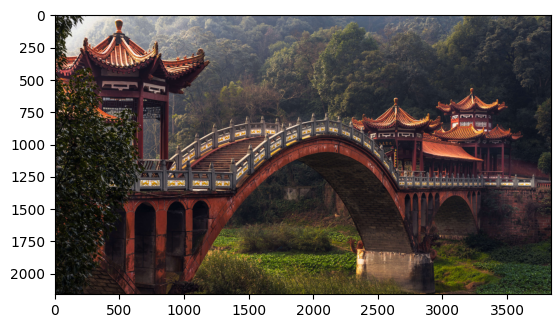

In [2]:
chinese_bridge = cv2.cvtColor(cv2.imread("../Images/chinese_bridge.jpg"), cv2.COLOR_BGR2RGB)
plt.imshow(chinese_bridge)
plt.show()

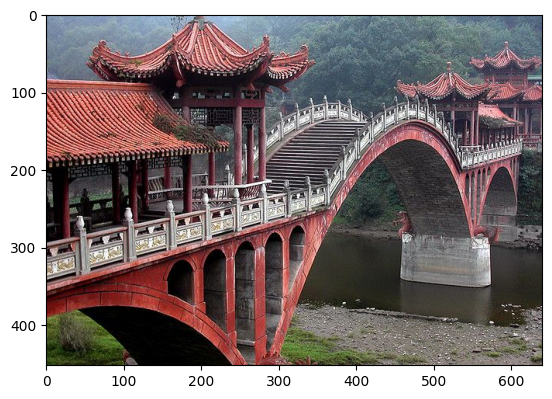

In [3]:
chinese_bridge2 = cv2.cvtColor(cv2.imread("../Images/chinese_bridge2.jpg"), cv2.COLOR_BGR2RGB)
plt.imshow(chinese_bridge2)
plt.show()

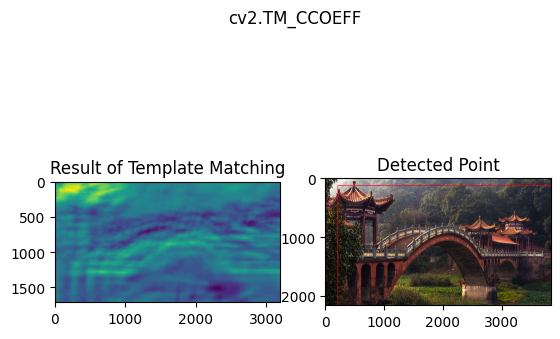

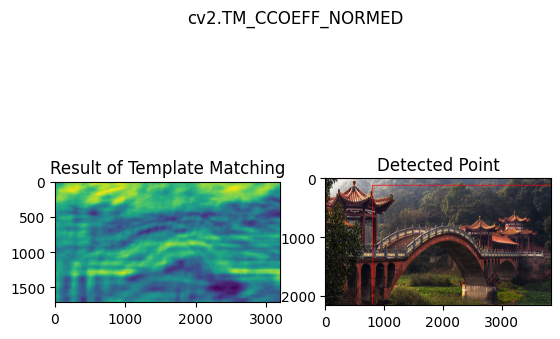

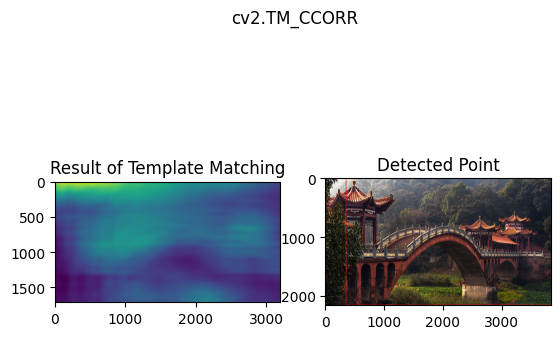

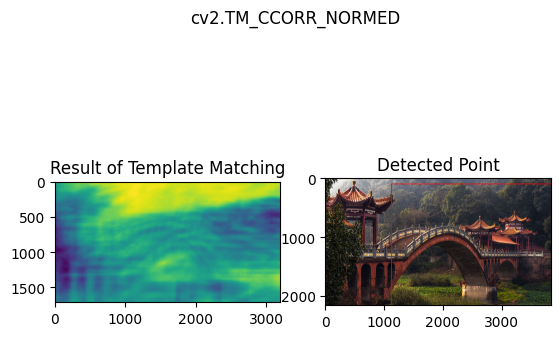

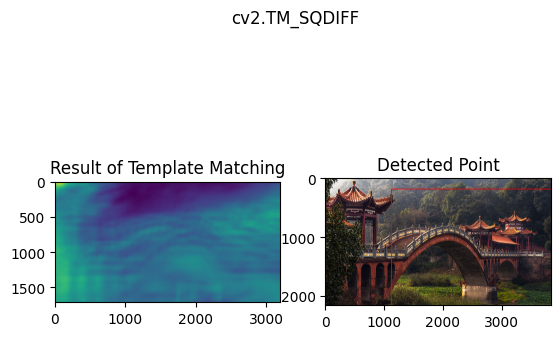

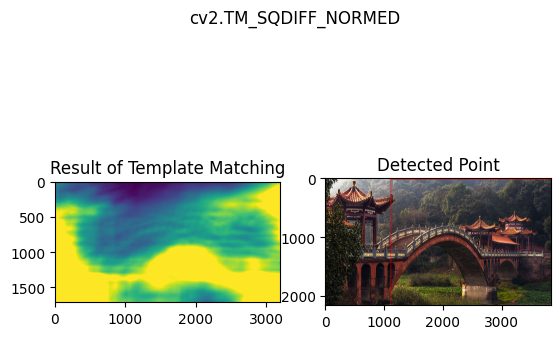

In [4]:
height, width,channels = chinese_bridge.shape


methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for m in methods:
    
    # Create a copy of the image
    birdge_copy = chinese_bridge.copy()
    
    # Get the actual function instead of the string
    method = eval(m)

    # Apply template Matching with the method
    res = cv2.matchTemplate(birdge_copy,chinese_bridge2,method)
    
    # Grab the Max and Min values, plus their locations
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    
    # Set up drawing of Rectangle
    
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    # Notice the coloring on the last 2 left hand side images.
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc    
    else:
        top_left = max_loc
        
    # Assign the Bottom Right of the rectangle
    bottom_right = (top_left[0] + width, top_left[1] + height)

    # Draw the Red Rectangle
    cv2.rectangle(birdge_copy,top_left, bottom_right, 255, 10)

    # Plot the Images
    plt.subplot(121)
    plt.imshow(res)
    plt.title('Result of Template Matching')
    
    plt.subplot(122)
    plt.imshow(birdge_copy)
    plt.title('Detected Point')
    plt.suptitle(m)
    
    
    plt.show()
    print('\n')
    print('\n')
    

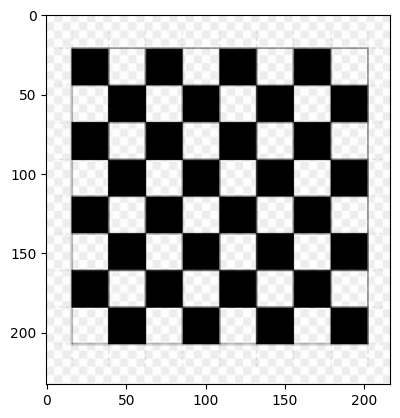

In [15]:
checker_board = cv2.cvtColor(cv2.imread("../Images/checkerboard.png"), cv2.COLOR_BGR2RGB)
plt.imshow(checker_board)
plt.show()

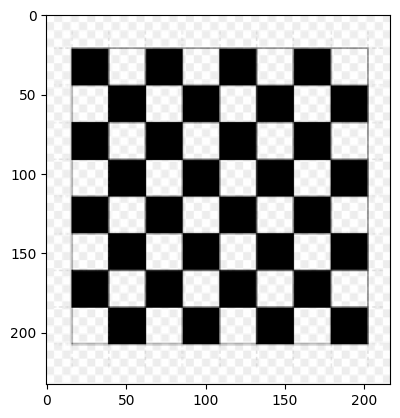

In [6]:
gray_checker_board = cv2.cvtColor(checker_board, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_checker_board, cmap='gray')
plt.show()

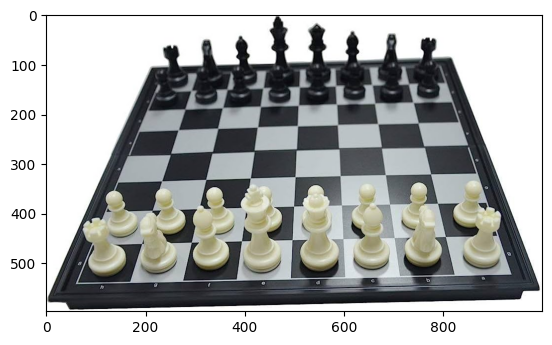

In [7]:
chessboard = cv2.cvtColor(cv2.imread("../Images/chessboard.jpg"), cv2.COLOR_BGR2RGB)
plt.imshow(chessboard)
plt.show()

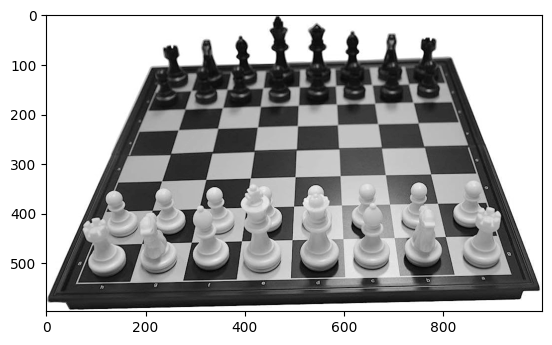

In [10]:
gray_chessboard = cv2.cvtColor(chessboard, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_chessboard, cmap='gray')
plt.show()

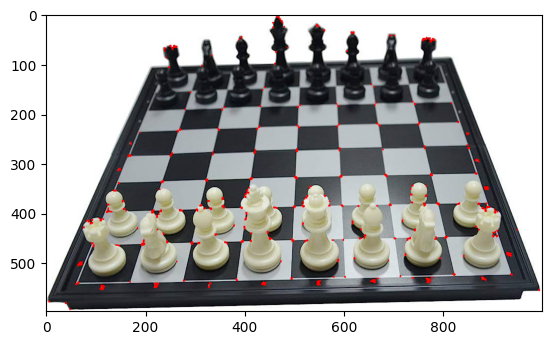

In [23]:
gray_chessboard = np.float32(gray_chessboard)
dst = cv2.cornerHarris(src=gray_chessboard, blockSize=2, ksize=3, k=0.04)
dst = cv2.dilate(dst, None)

chessboard[dst > 0.01 * dst.max()] = [255, 0, 0]
plt.imshow(chessboard)
plt.show()

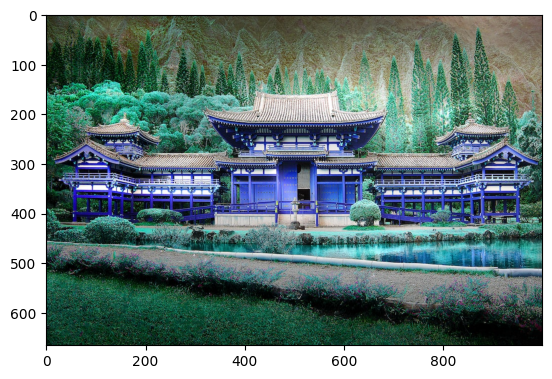

In [5]:
oriental_architecture = cv2.imread("../Images/oriental_architecture.jpeg")
show_image(oriental_architecture)

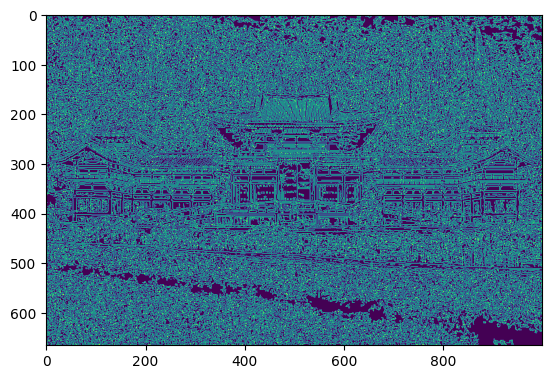

In [8]:
oriental_canny = cv2.Canny(image=oriental_architecture, threshold1=0, threshold2=127)
show_image(oriental_canny)

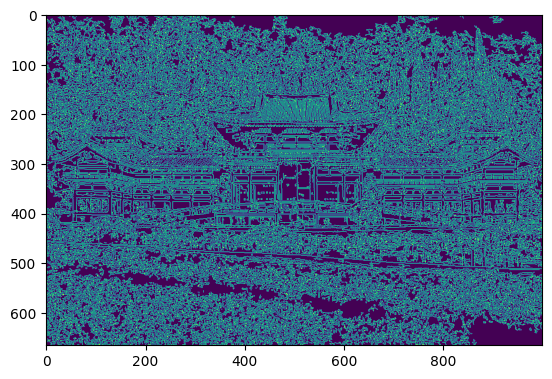

In [9]:
oriental_canny = cv2.Canny(image=oriental_architecture, threshold1=0, threshold2=255)
show_image(oriental_canny)

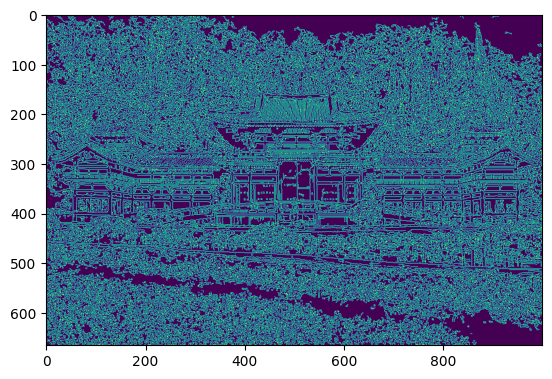

In [10]:
med_val = np.median(oriental_architecture)
lower = int(max(0, 0.7 * med_val))   #Lower threshold to either 70% or 0 of the median value whichever is greater
upper = int(min(255, 1.3 * med_val)) #Upper threshold to either 130% of the median or the max, whichever is smaller

edges = cv2.Canny(image=oriental_architecture, threshold1=lower, threshold2=upper+100)
show_image(edges)

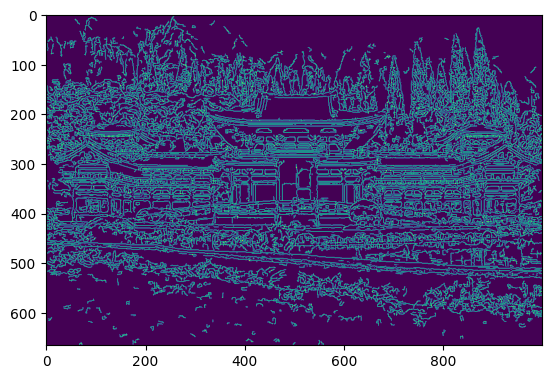

In [12]:
blurred_oriental = cv2.blur(oriental_architecture, ksize=(5,5))
edges = cv2.Canny(image=blurred_oriental, threshold1=lower, threshold2=upper)
show_image(edges)

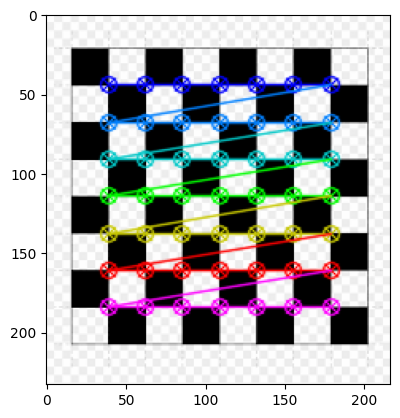

In [18]:
found, corners = cv2.findChessboardCorners(checker_board, (7, 7))
cv2.drawChessboardCorners(checker_board, (7, 7), corners, found)
show_image(checker_board)

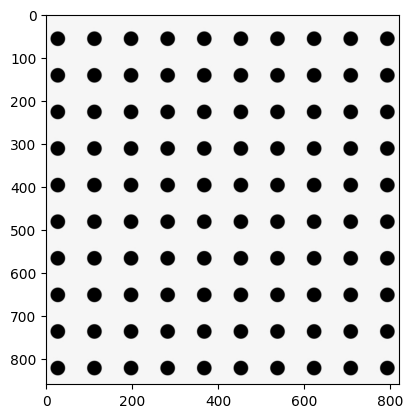

In [19]:
dots = cv2.imread("../Images/dots.jpeg")
show_image(dots)

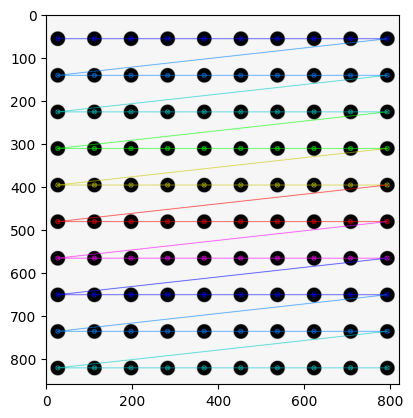

In [21]:
found, corners = cv2.findCirclesGrid(dots, (10, 10), cv2.CALIB_CB_SYMMETRIC_GRID)
cv2.drawChessboardCorners(dots, (10, 10), corners, found)
show_image(dots)

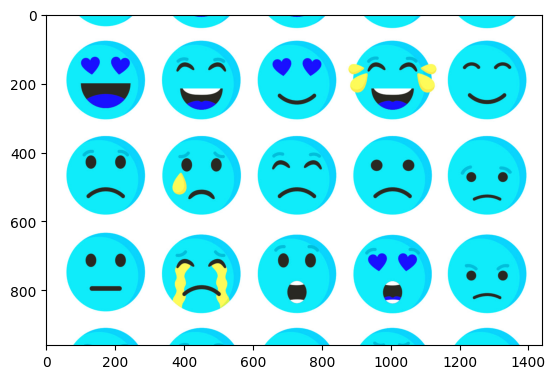

In [23]:
emojis = cv2.imread("../Images/emojis.jpg")
plt.imshow(emojis, cmap='gray')
plt.show()

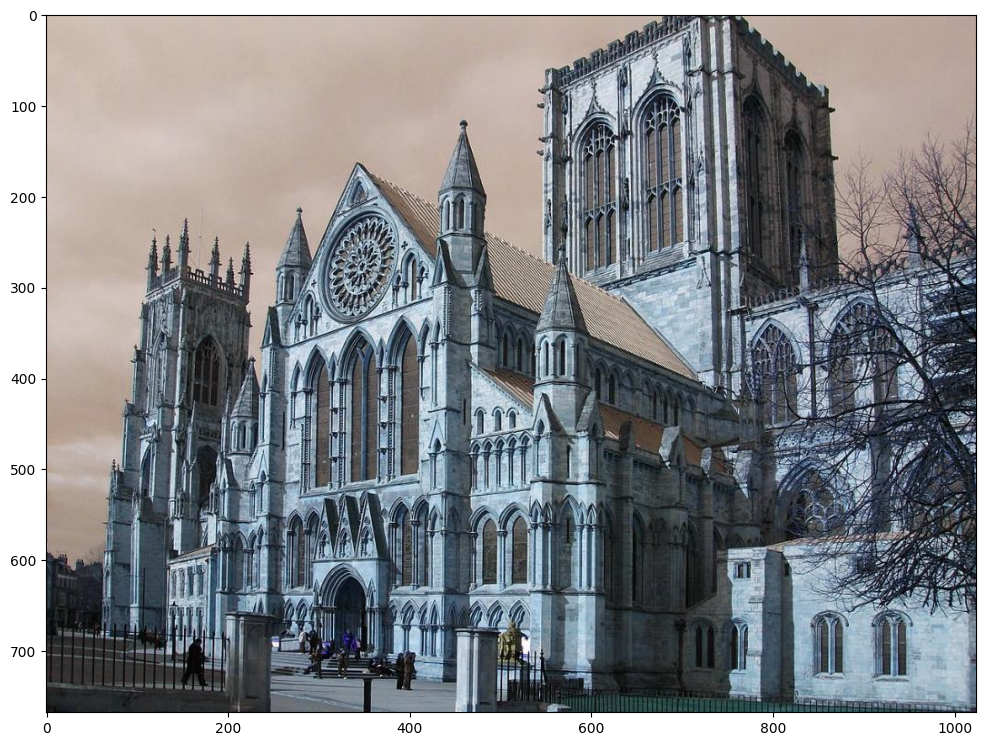

In [7]:
york_minister1 = cv2.imread("../Images/york_minister1.jpg")
display(york_minister1)

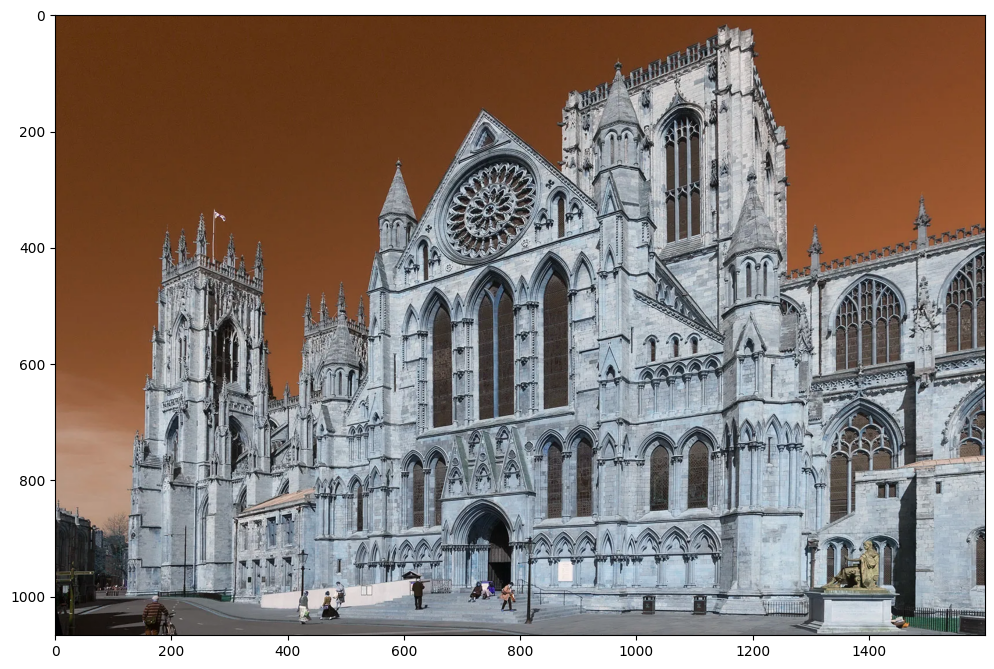

In [8]:
york_minister2 = cv2.imread("../Images/york_minister2.webp")
display(york_minister2)

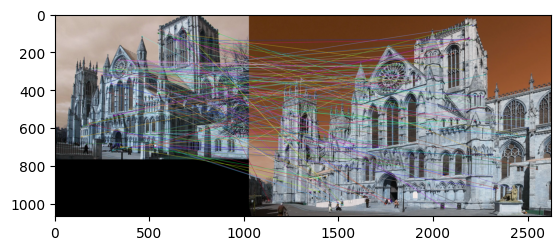

In [16]:
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(york_minister1, None)
kp2, des2 = orb.detectAndCompute(york_minister2, None)

brute_force = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = brute_force.match(des1, des2)
matches = sorted(matches, key=lambda x:x.distance)

minister_matches = cv2.drawMatches(york_minister1, kp1, york_minister2, kp2, matches, None, flags=2)
show_image(minister_matches)

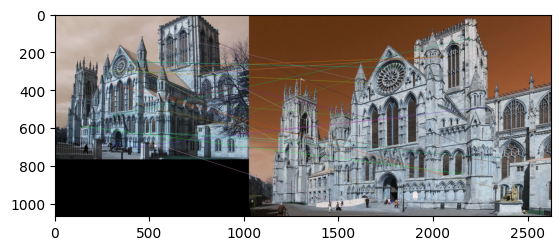

In [17]:
minister_matches = cv2.drawMatches(york_minister1, kp1, york_minister2, kp2, matches[:25], None, flags=2)
show_image(minister_matches)

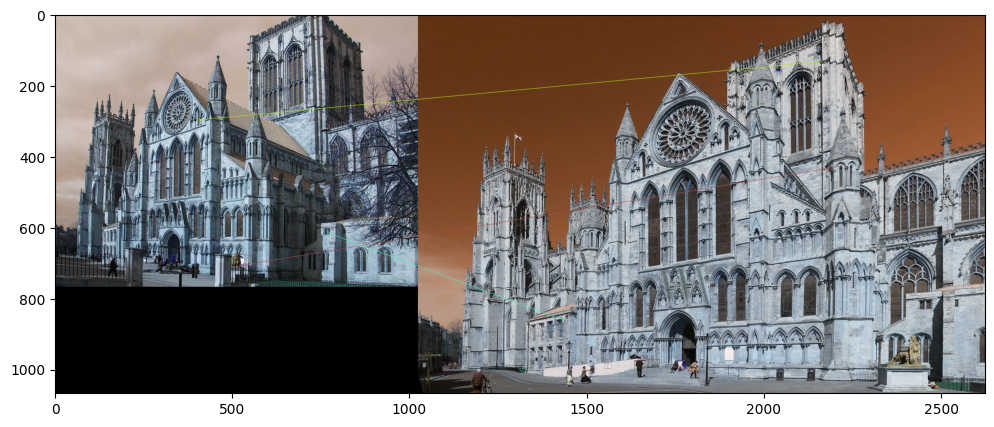

In [22]:
sift = cv2.xfeatures2d.SIFT_create()

kp1, des1 = orb.detectAndCompute(york_minister1, None)
kp2, des2 = orb.detectAndCompute(york_minister2, None)

bf = cv2.BFMatcher()

matches = bf.knnMatch(des1, des2, k=2)

good = []

#Less distance == better match

for match1, match2 in matches:
    #If match 1 distance is less than 75% of match 2 distance
    #Then descriptor was a good match , lets keep it!
    
    if match1.distance < 0.75 * match2.distance:
        good.append([match1])
        
sift_matches = cv2.drawMatchesKnn(york_minister1, kp1, york_minister2, kp2, good, None, flags=2)
display(sift_matches)

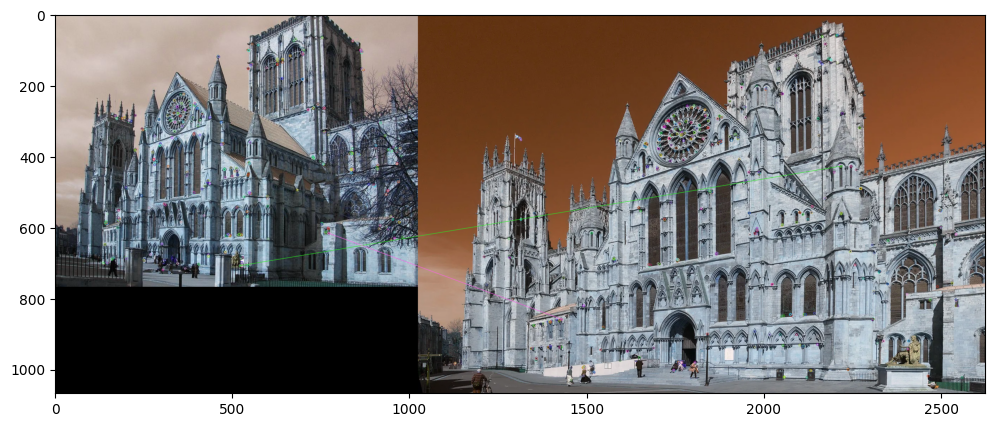

In [26]:
# Flann

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Assuming des1 and des2 are descriptors of type numpy.ndarray
des1 = des1.astype(np.float32)
des2 = des2.astype(np.float32)

matches = flann.knnMatch(des1, des2, k=2)

good = []

for match1, match2 in matches:
    if match1.distance < 0.7 * match2.distance:
        good.append([match1])
        
flann_matches = cv2.drawMatchesKnn(york_minister1, kp1, york_minister2, kp2, good, None, flags=0)
display(flann_matches)

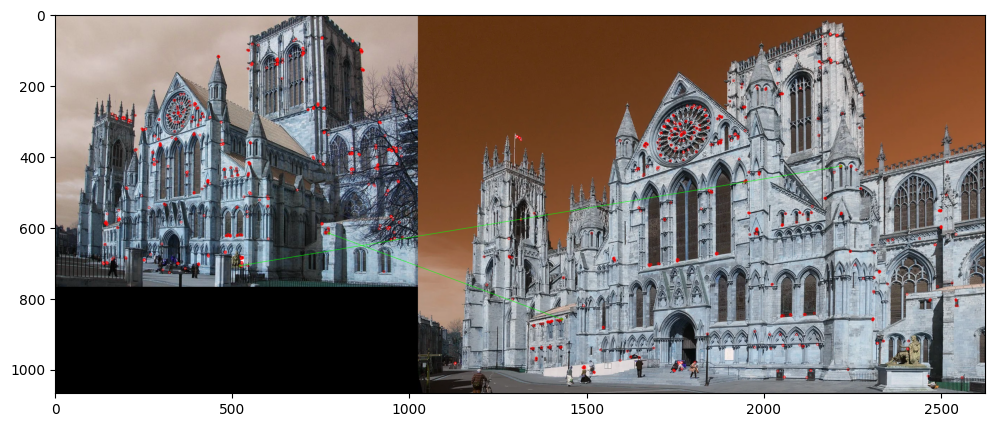

In [32]:
matchesMask = [[0, 0] for i in range(len(kp1))]

for i, (match1, match2) in enumerate(matches):
    if match1.distance < 0.7 * match2.distance:
        matchesMask[i] = [1, 0]

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), matchesMask=matchesMask, flags=0)
flann_matches = cv2.drawMatchesKnn(york_minister1, kp1, york_minister2, kp2, matches, None, **draw_params)
display(flann_matches)

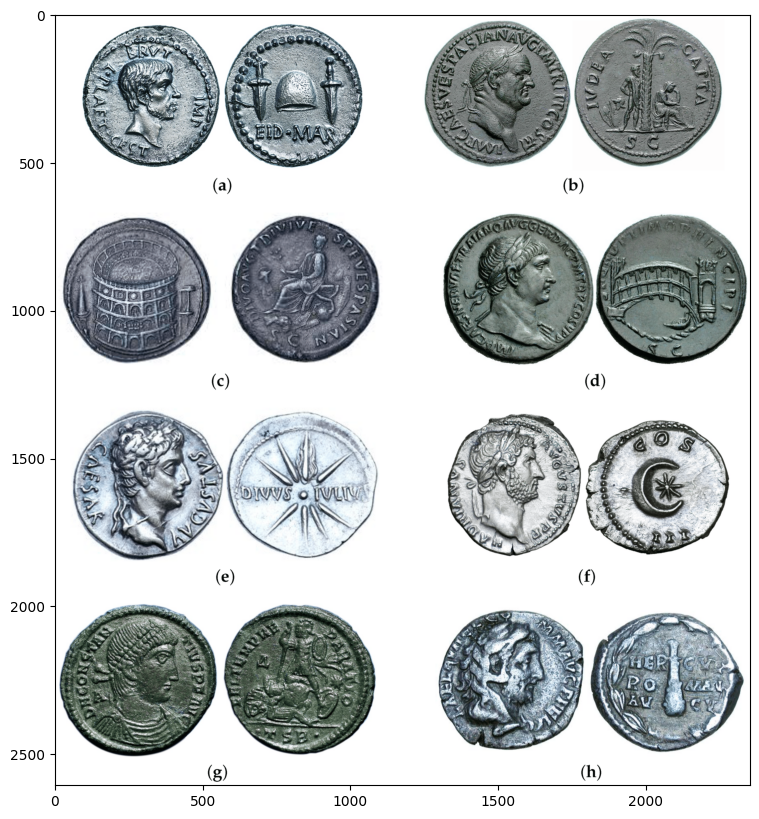

In [33]:
ancient_coins = cv2.imread("../Images/ancient_coins.png")
display(ancient_coins)

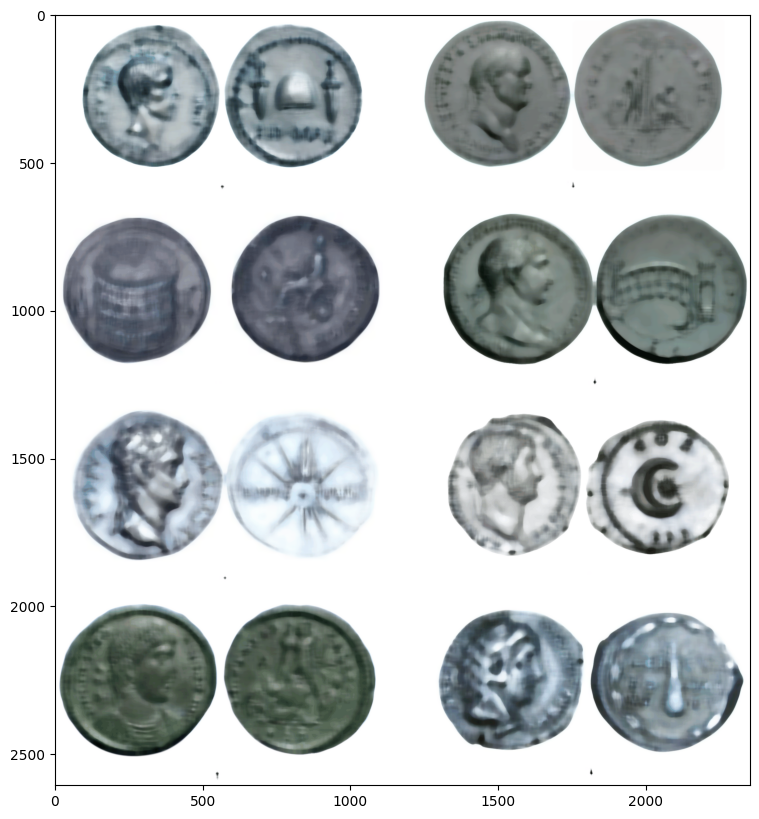

In [37]:
# Median Blur

# Grayscale

# Binary Threshold

# Find Contours

coins_blur = cv2.medianBlur(ancient_coins, 25)
display(coins_blur)

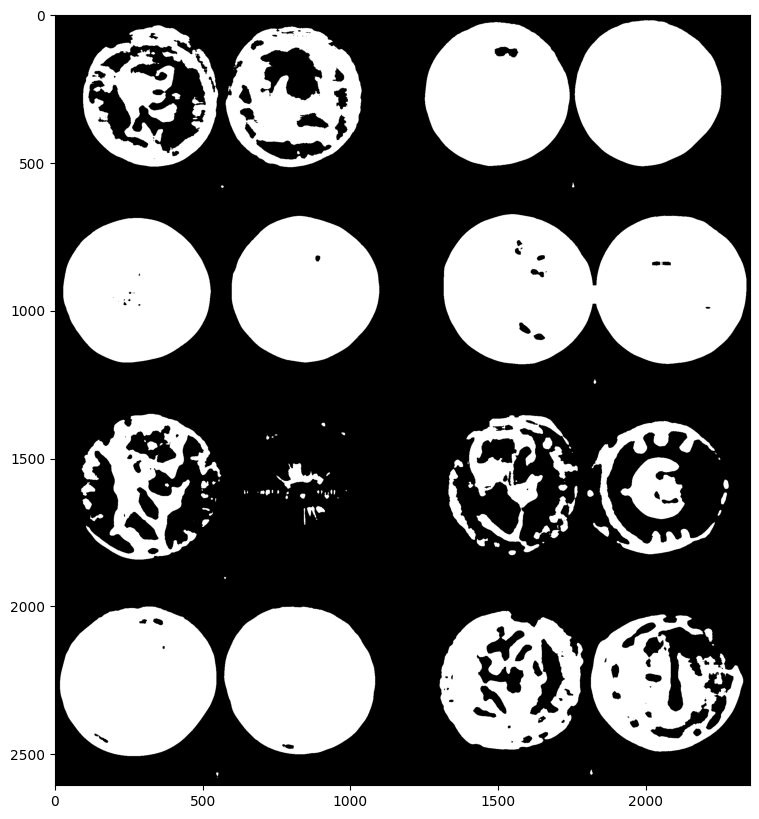

In [44]:
gray_coins = cv2.cvtColor(coins_blur, cv2.COLOR_BGR2GRAY)

ret, sep_thresh = cv2.threshold(gray_coins, 160, 255, cv2.THRESH_BINARY_INV)

display(sep_thresh)

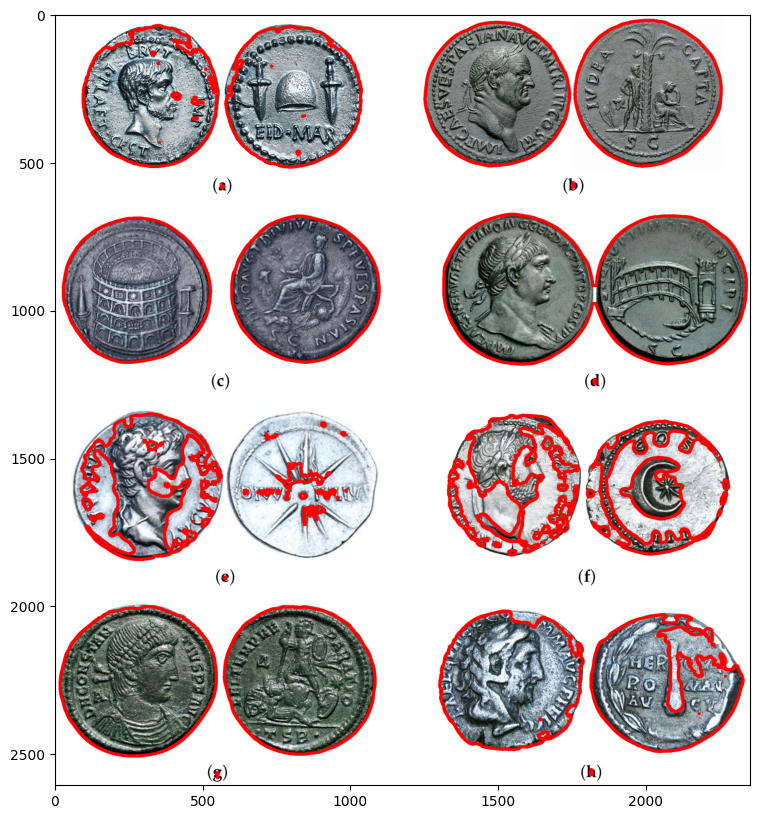

In [47]:
contours, hierarchy = cv2.findContours(sep_thresh.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

for i in range(len(contours)):
    if hierarchy[0][i][3] == -1:
        cv2.drawContours(ancient_coins, contours, i, (255, 0, 0), 10)
        
display(ancient_coins)

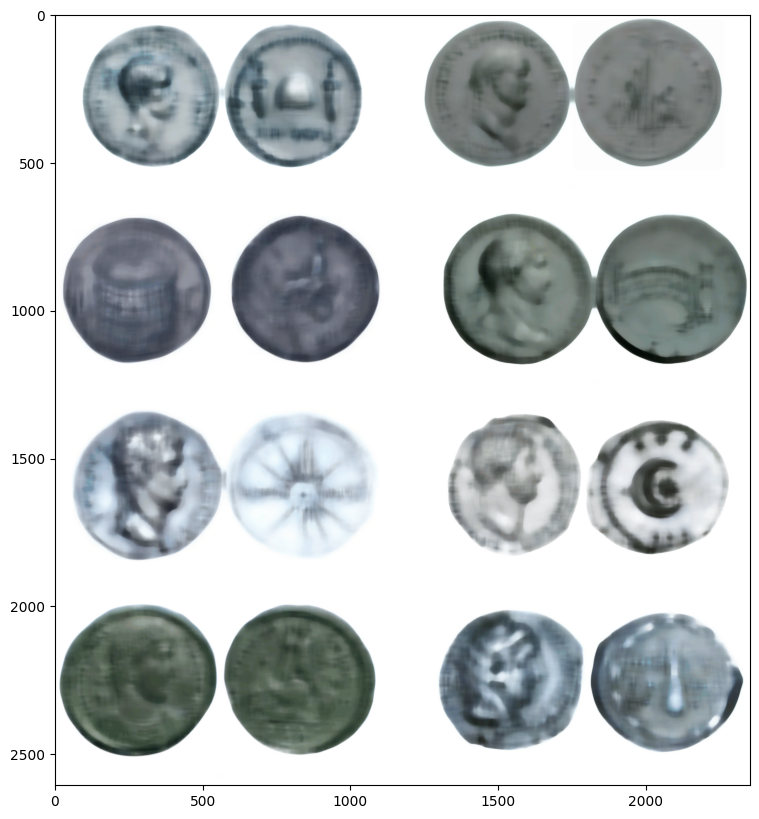

In [48]:
img = cv2.imread("../Images/ancient_coins.png")
img = cv2.medianBlur(img, 35)
display(img)

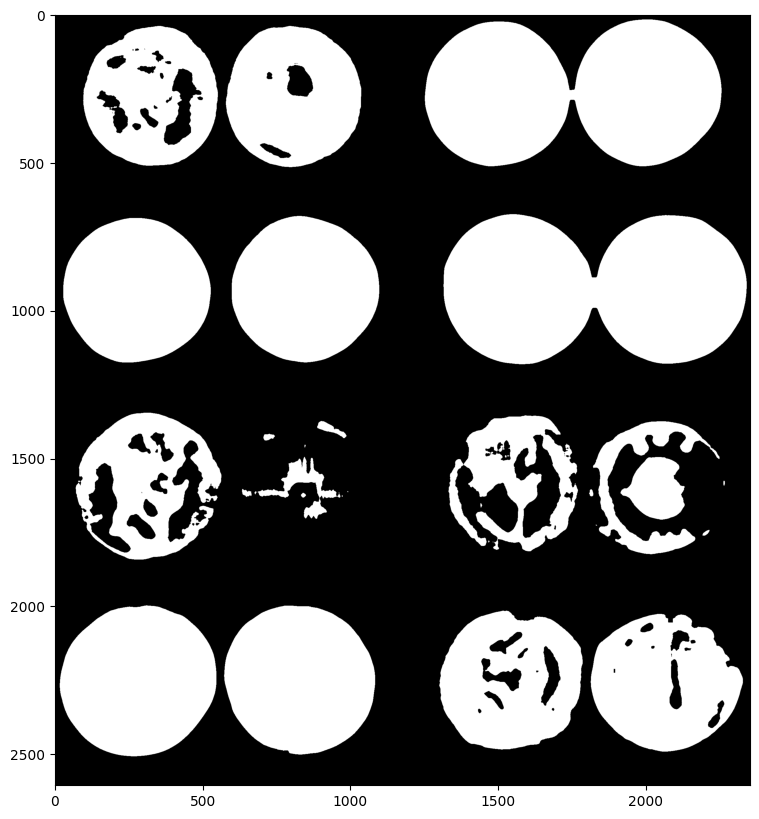

In [59]:
sure_bg = cv2.dilate(opening, kernel, iterations=3)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
display(thresh)

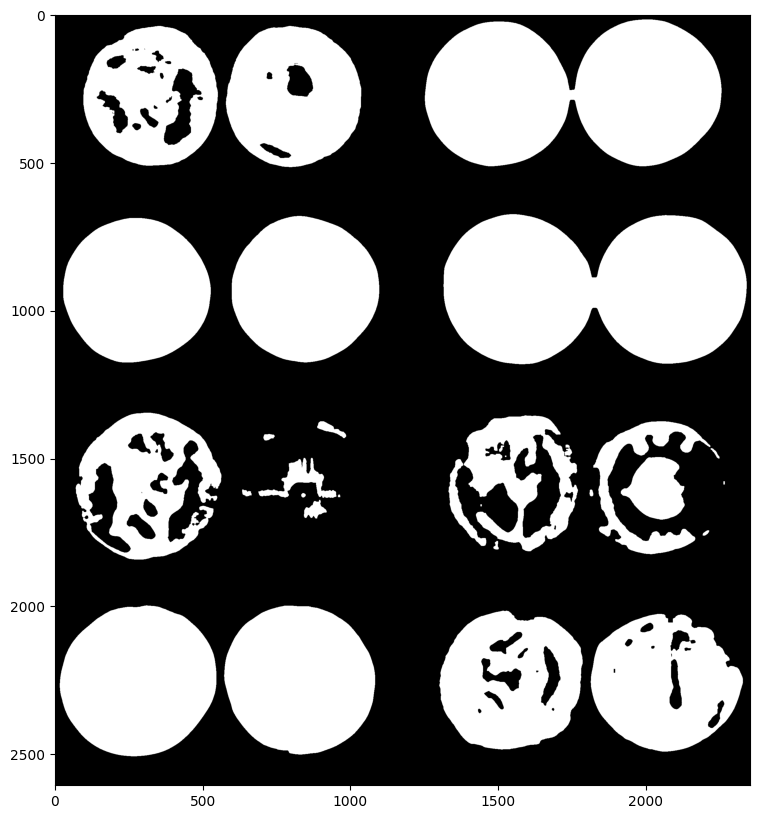

In [60]:
# Noise removal 

kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
display(opening)

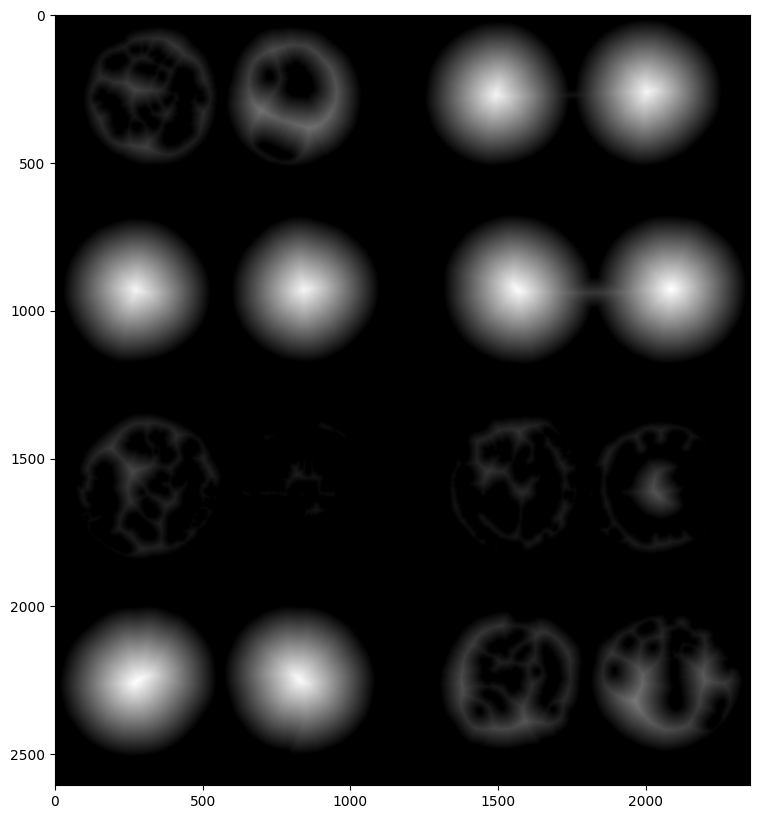

In [61]:
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
display(dist_transform)

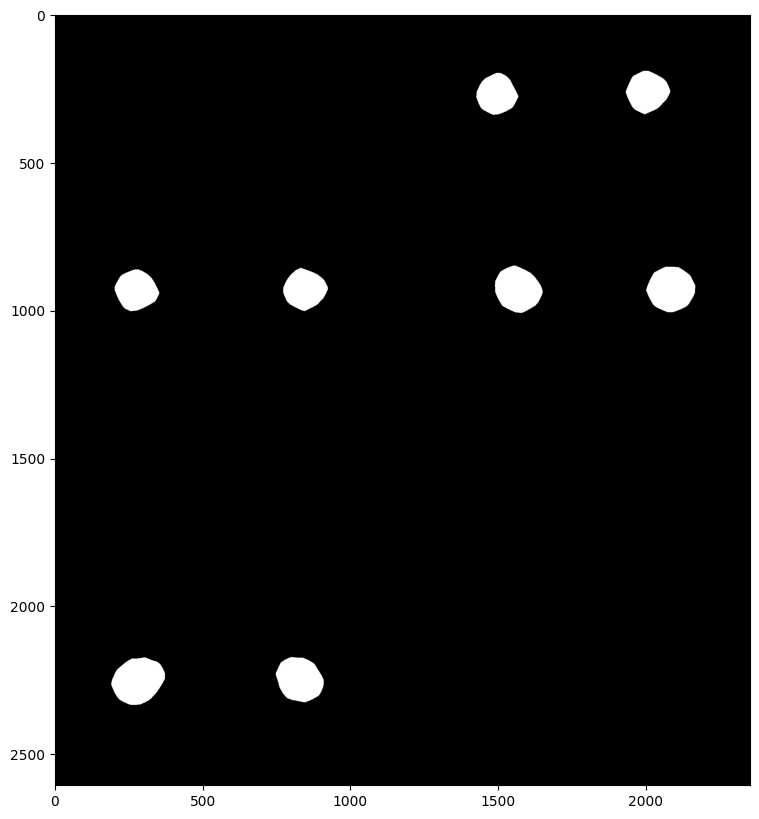

In [62]:
ret, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)
display(sure_fg)

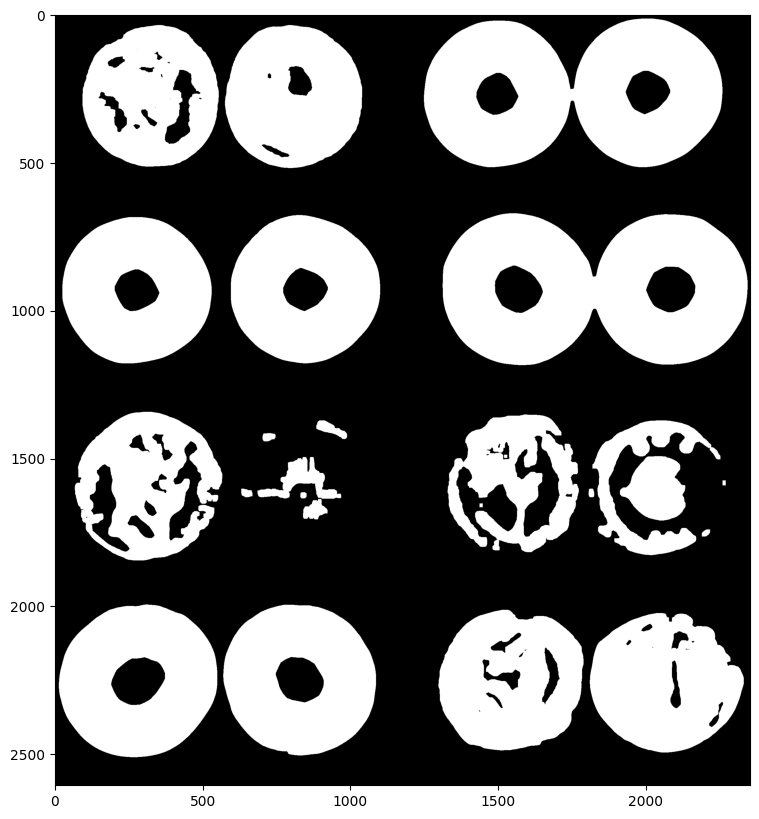

In [63]:
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)
display(unknown)

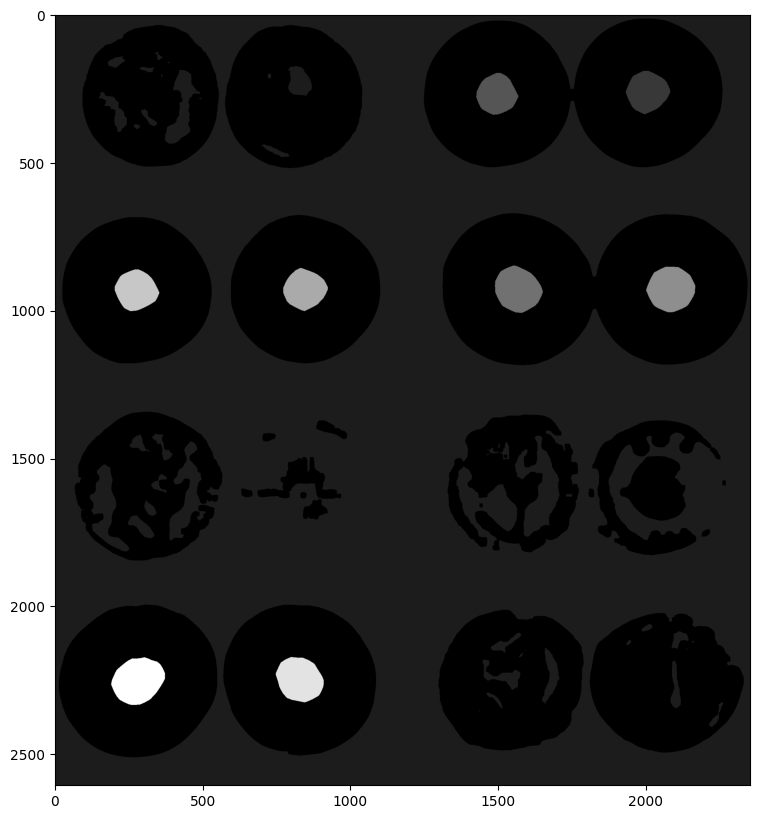

In [64]:
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1

markers[unknown==255] = 0
display(markers)

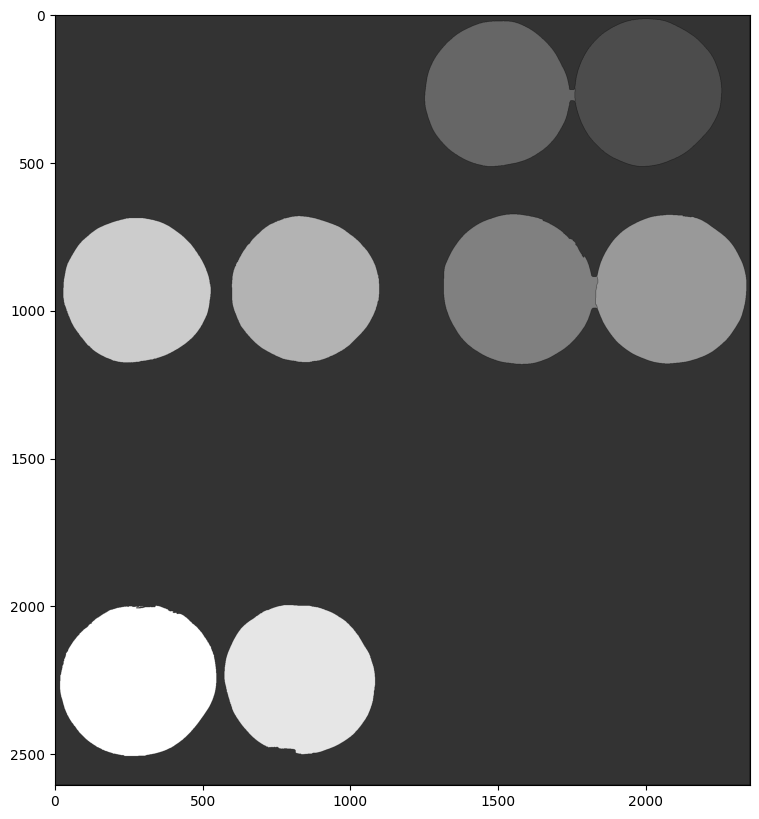

In [65]:
markers = cv2.watershed(img, markers)
display(markers)

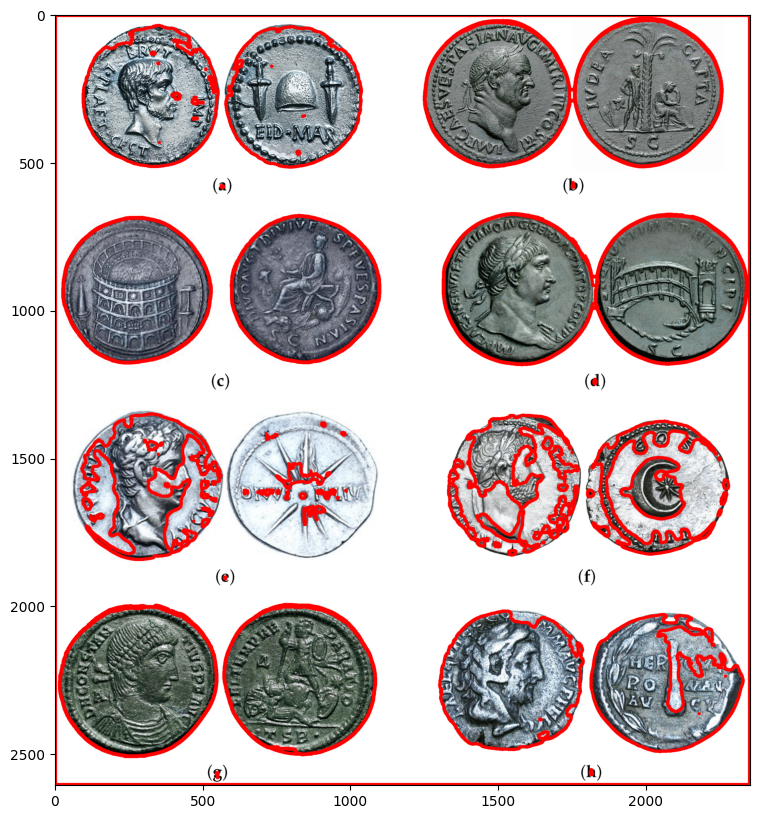

In [67]:
contours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

for i in range(len(contours)):
    if hierarchy[0][i][3] == -1:
        cv2.drawContours(ancient_coins, contours, i, (255, 0, 0), 10)
        
display(ancient_coins)

In [4]:
road = cv2.imread('../Images/my_selfie.png')
road_copy = np.copy(road)

marker_image = np.zeros(road.shape[:2],dtype=np.int32)

segments = np.zeros(road.shape,dtype=np.uint8)

def create_rgb(i):
    x = np.array(cm.tab10(i))[:3]*255
    return tuple(x)

colors = []

# One color for each single digit
for i in range(10):
    colors.append(create_rgb(i))
    
# Numbers 0-9
n_markers = 10

# Default settings
current_marker = 1
marks_updated = False

def mouse_callback(event, x, y, flags, param):
    global marks_updated 

    if event == cv2.EVENT_LBUTTONDOWN:
        
        # TRACKING FOR MARKERS
        cv2.circle(marker_image, (x, y), 10, (current_marker), -1)
        
        # DISPLAY ON USER IMAGE
        cv2.circle(road_copy, (x, y), 10, colors[current_marker], -1)
        marks_updated = True

        
cv2.namedWindow('Road Image')
cv2.setMouseCallback('Road Image', mouse_callback)

while True:
    
    # SHow the 2 windows
    cv2.imshow('WaterShed Segments', segments)
    cv2.imshow('Road Image', road_copy)
        
        
    # Close everything if Esc is pressed
    k = cv2.waitKey(1)

    if k == 27:
        break
        
    # Clear all colors and start over if 'c' is pressed
    elif k == ord('c'):
        road_copy = road.copy()
        marker_image = np.zeros(road.shape[0:2], dtype=np.int32)
        segments = np.zeros(road.shape,dtype=np.uint8)
        
    # If a number 0-9 is chosen index the color
    elif k > 0 and chr(k).isdigit():
        # chr converts to printable digit
        
        current_marker  = int(chr(k))
        
        # CODE TO CHECK INCASE USER IS CARELESS
#         n = int(chr(k))
#         if 1 <= n <= n_markers:
#             current_marker = n
    
    # If we clicked somewhere, call the watershed algorithm on our chosen markers
    if marks_updated:
        
        marker_image_copy = marker_image.copy()
        cv2.watershed(road, marker_image_copy)
        
        segments = np.zeros(road.shape,dtype=np.uint8)
        
        for color_ind in range(n_markers):
            segments[marker_image_copy == (color_ind)] = colors[color_ind]
        
        marks_updated = False
        
cv2.destroyAllWindows()

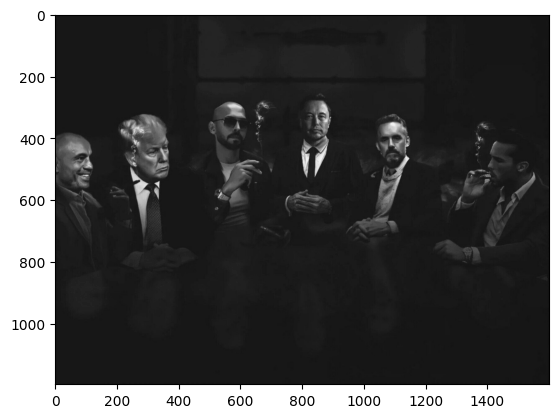

In [3]:
topg = cv2.imread("../Images/topg_potrait.webp", 0)
trump = cv2.imread("../Images/trump_potrait.jpg", 0)
escape_the_matrix = cv2.imread("../Images/escape_the_matrix.jpg", 0)

plt.imshow(escape_the_matrix, cmap='gray')
plt.show()

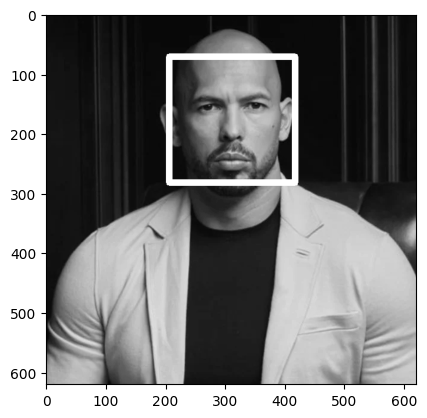

In [6]:
face_cascade = cv2.CascadeClassifier("../Datasets/haarcascades/haarcascade_frontalface_default.xml")

def detect_face(img):
    
    face_img = img.copy()
    
    face_rects = face_cascade.detectMultiScale(face_img, scaleFactor=1.2, minNeighbors=5)
    
    for (x, y, w, h) in face_rects:
        cv2.rectangle(face_img, (x, y), (x + w, y + h), (255, 255, 255), 10)
    
    return face_img

result1 = detect_face(topg)
plt.imshow(result1, cmap='gray')
plt.show()

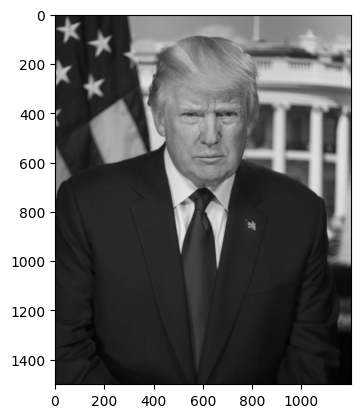

In [5]:
result2 = detect_face(trump)
plt.imshow(result2, cmap='gray')
plt.show()

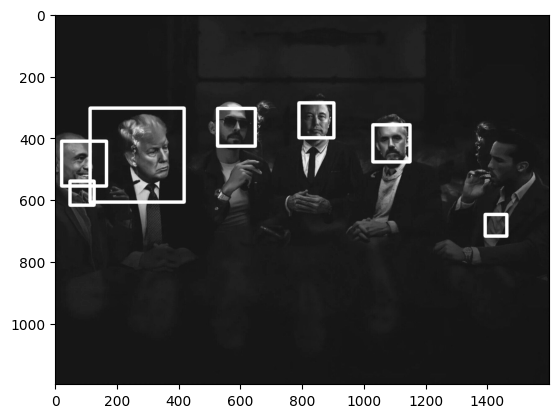

In [10]:
result3 = detect_face(escape_the_matrix)
plt.imshow(result3, cmap='gray')
plt.show()

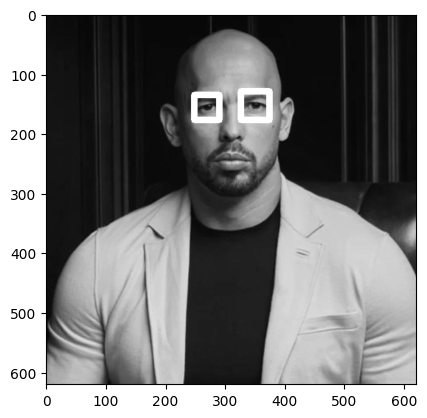

In [13]:
eye_cascade = cv2.CascadeClassifier("../Datasets/haarcascades/haarcascade_eye.xml")

def detect_eyes(img):
    
    face_img = img.copy()
    
    face_rects = eye_cascade.detectMultiScale(face_img)
    
    for (x, y, w, h) in face_rects:
        cv2.rectangle(face_img, (x, y), (x + w, y + h), (255, 255, 255), 10)
    
    return face_img

result1 = detect_eyes(topg)
plt.imshow(result1, cmap='gray')
plt.show()

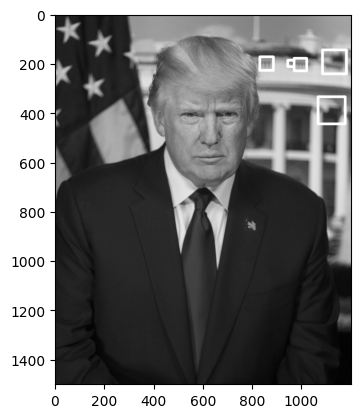

In [14]:
result2 = detect_eyes(trump)
plt.imshow(result2, cmap='gray')
plt.show()

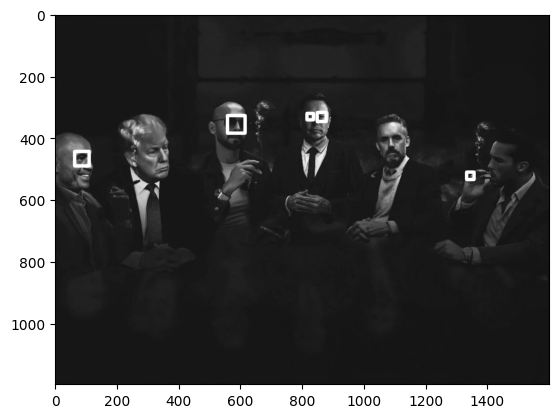

In [15]:
result3 = detect_eyes(escape_the_matrix)
plt.imshow(result3, cmap='gray')
plt.show()

In [16]:
cap = cv2.VideoCapture(0)

while True:
    
    ret, frame = cap.read(0)
    
    frame = detect_face(frame)
    
    cv2.imshow("Video Face Detect", frame)
    
    k = cv2.waitKey(1)
    if k == 27:
        break
        
cap.release()
cv2.destroyAllWindows()

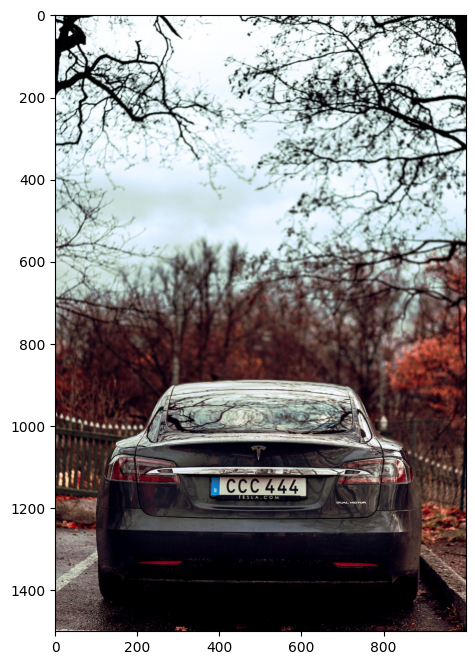

In [20]:
img1 = cv2.imread("../Images/licence_plate1.jpeg")
img2 = cv2.imread("../Images/licence_plate2.jpeg")

def display(img):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    new_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(new_img)
    
plate_cascade = cv2.CascadeClassifier("../Datasets/haarcascades/haarcascade_russian_plate_number.xml")

def detect_plate(img):
    plate_img = img.copy()
    plate_rects = plate_cascade.detectMultiScale(plate_img, scaleFactor=1.3, minNeighbors=3)
    
    for (x, y, w, h) in plate_rects:
        cv2.rectangle(plate_img, (x, y), (x + w, y + h), (0, 0, 255), 4)
        
    return plate_img

result1 = detect_plate(img1)
display(result1)

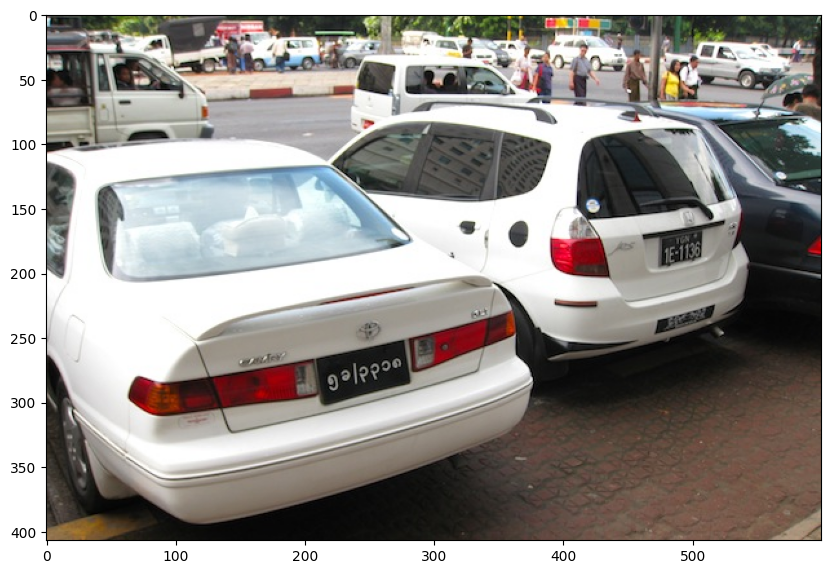

In [21]:
result2 = detect_plate(img2)
display(result2)

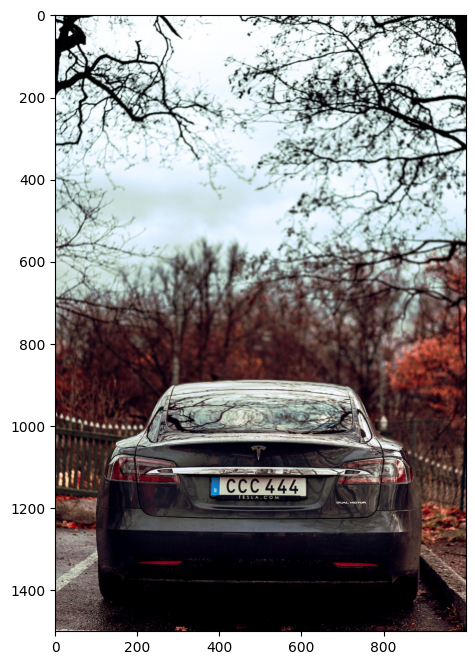

In [22]:
def detect_and_blur_plate(img):
    
    plate_img = img.copy()
    roi = img.copy()
    
    plate_rects = plate_cascade.detectMultiScale(plate_img, scaleFactor=1.3, minNeighbors=3)
    
    for (x, y, w, h) in plate_rects:
        
        roi = roi[y:y+h, x:x+w]
        blurred_roi = cv2.medianBlur(roi, 7)
        plate_img[y:y+h, x:x+w] = blurred_roi
        
    return plate_img

result1 = detect_and_blur_plate(img1)
display(result1)